In [1]:
from google.colab import files


uploaded = files.upload()


Saving License Plate Detection.v1i.yolov5pytorch.zip to License Plate Detection.v1i.yolov5pytorch (2).zip


In [2]:
# Remove any old versions
!pip uninstall -y torch torchvision torchaudio ultralytics wandb -q

# Install PyTorch 2.5.1 (works with YOLOv8 weights, no UnpicklingError)
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 --index-url https://download.pytorch.org/whl/cu121

# Install stable YOLOv8
!pip install ultralytics==8.0.120


Looking in indexes: https://download.pytorch.org/whl/cu121
  Using cached https://download.pytorch.org/whl/cu121/torch-2.5.1%2Bcu121-cp312-cp312-linux_x86_64.whl (780.4 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchvision-0.20.1%2Bcu121-cp312-cp312-linux_x86_64.whl (7.3 MB)
  Using cached https://download.pytorch.org/whl/cu121/torchaudio-2.5.1%2Bcu121-cp312-cp312-linux_x86_64.whl (3.4 MB)
  Using cached ultralytics-8.0.120-py3-none-any.whl.metadata (27 kB)
Using cached ultralytics-8.0.120-py3-none-any.whl (611 kB)


In [3]:
import torch

print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU name:", torch.cuda.get_device_name(0))


CUDA available: True
GPU name: Tesla T4


In [4]:
import zipfile, os


dataset_zip = "License Plate Detection.v1i.yolov5pytorch.zip"

with zipfile.ZipFile(dataset_zip, 'r') as zip_ref:
    zip_ref.extractall("/content/data/")

print("Extracted files:", os.listdir("/content/data/"))


Extracted files: ['README.roboflow.txt', 'README.dataset.txt', 'valid', 'train', 'test', 'data.yaml']


In [5]:
!cat /content/data/data.yaml


train: ../train/images
val: ../valid/images
test: ../test/images

nc: 2
names: ['num_plate', 'number_plate']

roboflow:
  workspace: project-7sclt
  project: license-plate-detection-jbxjp
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/project-7sclt/license-plate-detection-jbxjp/dataset/1

In [9]:
# Remove PyTorch 2.6
!pip uninstall -y torch torchvision torchaudio

# Install PyTorch 2.5.1 (compatible with YOLOv8)
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 --index-url https://download.pytorch.org/whl/cu121


Found existing installation: torch 2.8.0+cu126
Uninstalling torch-2.8.0+cu126:
  Successfully uninstalled torch-2.8.0+cu126
Found existing installation: torchvision 0.23.0+cu126
Uninstalling torchvision-0.23.0+cu126:
  Successfully uninstalled torchvision-0.23.0+cu126
Found existing installation: torchaudio 2.8.0+cu126
Uninstalling torchaudio-2.8.0+cu126:
  Successfully uninstalled torchaudio-2.8.0+cu126
Looking in indexes: https://download.pytorch.org/whl/cu121
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 780.4/780.4 MB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.3/7.3 MB 113.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 87.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 71.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 48.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 75.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8

In [6]:
from ultralytics import YOLO

# Load YOLOv8n pretrained weights (should now work fine with PyTorch 2.5.1)
model = YOLO("yolov8n.pt")

# Full training
model.train(
    data="/content/data/data.yaml",
    epochs=100,
    imgsz=640,
    batch=16,
    project="runs",
    name="license_plate",
    verbose=True
)



/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:518: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


In [8]:
from ultralytics import YOLO


model = YOLO("/content/runs/license_plate9/weights/best.pt")


results = model.predict(
    source="/content/data/test/images",
    imgsz=640,
    conf=0.25,
    save=True
)



/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:518: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


✅ Inference complete! Check runs/detect/predict for outputs.


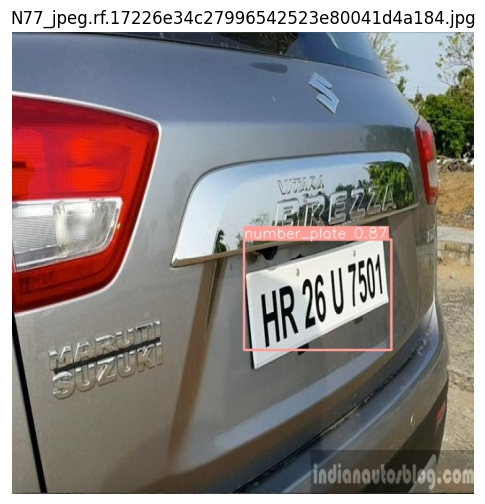

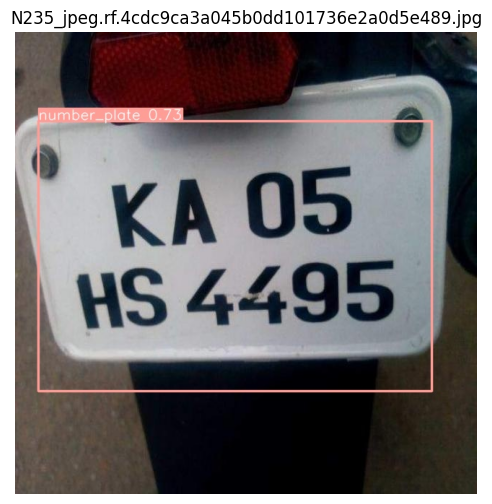

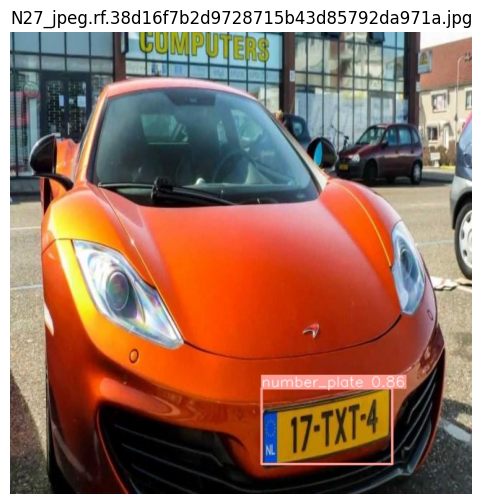

In [9]:
import matplotlib.pyplot as plt
import cv2
import glob


predicted_images = glob.glob("/content/runs/detect/predict/*.jpg")


for img_path in predicted_images[:3]:
    img = cv2.imread(img_path)[:,:,::-1]  # BGR → RGB
    plt.figure(figsize=(10,6))
    plt.imshow(img)
    plt.title(img_path.split("/")[-1])
    plt.axis("off")
    plt.show()


In [11]:
!pip install easyocr


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 50.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 963.8/963.8 kB 63.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.1/292.1 kB 29.1 MB/s eta 0:00:00


/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:518: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete


image 1/23 /content/data/test/images/N111_jpeg.rf.04c56819f9fa4b24ca255a859d21659a.jpg: 640x640 1 number_plate, 8.6ms
image 2/23 /content/data/test/images/N113_jpeg.rf.62bc8dc73e4182970e620e0ee5ff6d13.jpg: 640x640 1 number_plate, 7.4ms
image 3/23 /content/data/test/images/N128_jpeg.rf.85b3a990f1d768f50fa54ac50d9ab935.jpg: 640x640 1 number_plate, 7.3ms
image 4/23 /content/data/test/images/N132_jpeg.rf.fa68e421d729c0b2609fe5fdaff3d061.jpg: 640x640 (no detections), 7.7ms
image 5/23 /content/data/test/images/N136_jpeg.rf.0a082b44b1bfe3d2287c7dee25a375f4.jpg: 640x640 3 number_plates, 7.4ms
image 6/23 /content/data/test/images/N138_jpeg.rf.2c572eeb235cf393a71a91223684c3a0.jpg: 640x640 1 number_plate, 7.3ms
image 7/23 /content/data/test/images/N143_jpeg.rf.0cdbb4ab28cfdeda413185bfc187b70e.jpg: 640x640 1 number_plate, 9.6ms
image 8/23 /content/data/test/images/N164_jpeg.rf.793189d0b6752af58e6d939746dc54db.jpg: 640x640 1 number_plate, 10.2ms
image 9/23 /content/data/test/images/N171_jpeg.rf.66

Detected Plate: ['[NO7BV52OO']


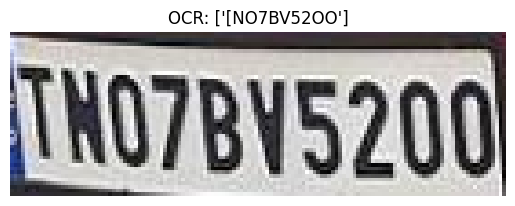

Detected Plate: ['KA DIMA', '6909']


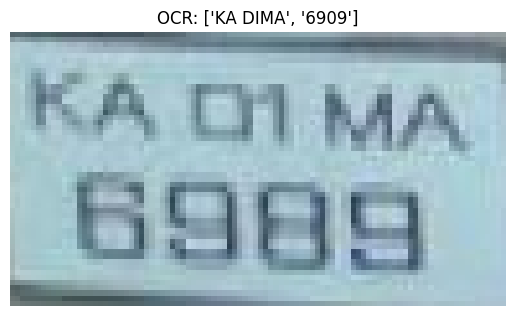

Detected Plate: ['ILOIKLOKLO ']


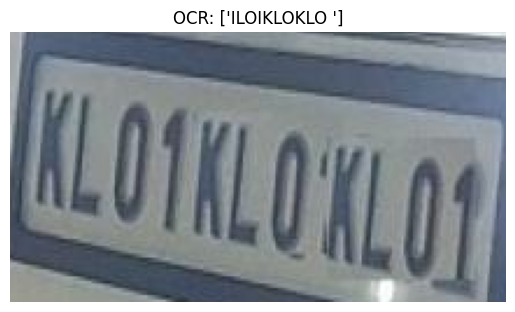

Detected Plate: ['IMIIMI']


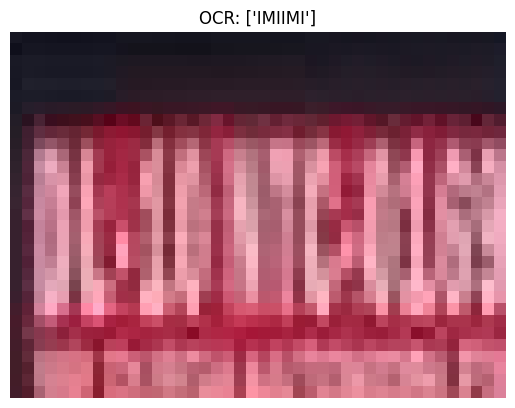

Detected Plate: ['ILMMIN ']


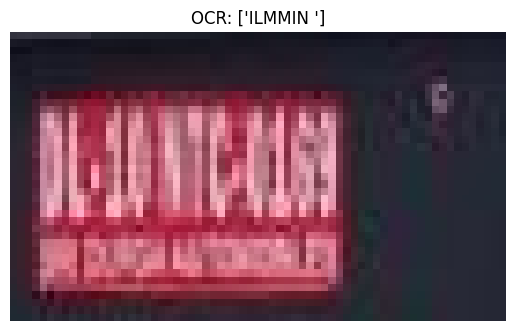

Detected Plate: ['ILIMIH']


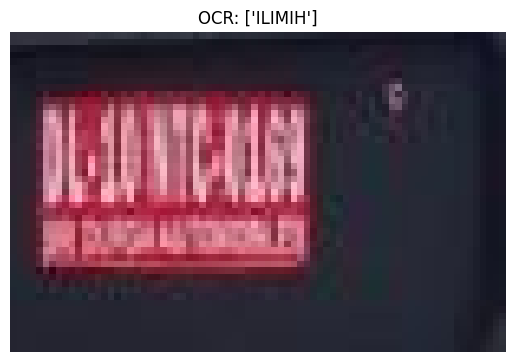

Detected Plate: ['"TSOBER164']


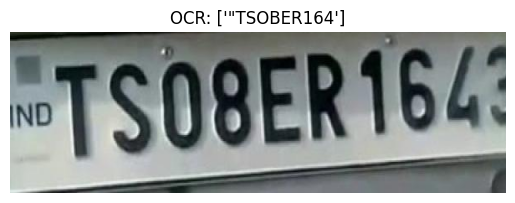

Detected Plate: ['TN 42R', '2697']


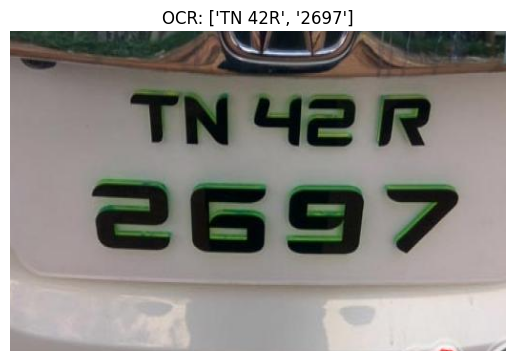

Detected Plate: ['KLOALA255I']


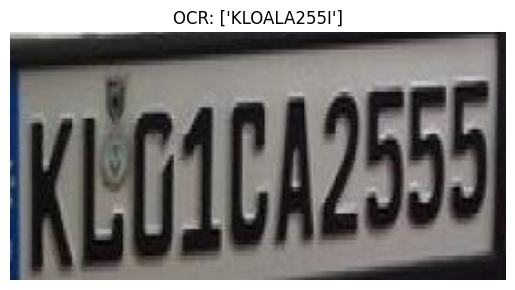

Detected Plate: ['INd', "'KHOHHEbOU}"]


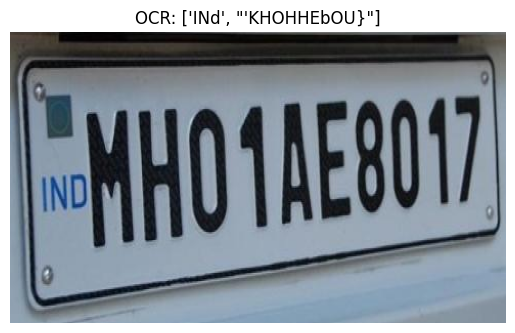

Detected Plate: ['02 CB', 'MH', '4545']


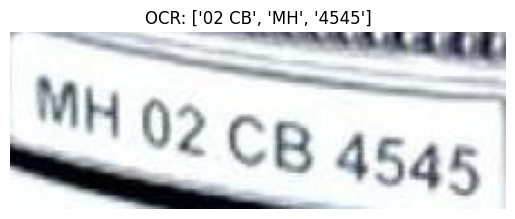

Detected Plate: ['"\'Ka 21', '05519']


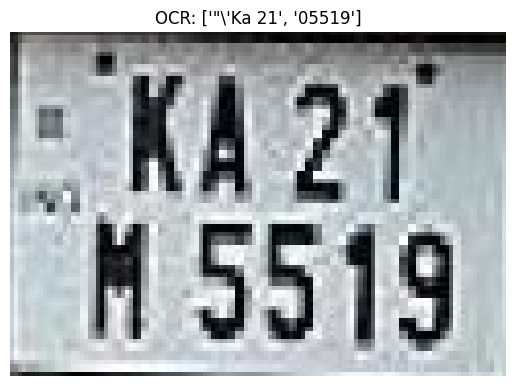

Detected Plate: ['MHO2ct2727']


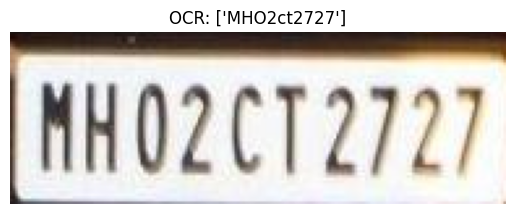

Detected Plate: ['DL3CAY2231']


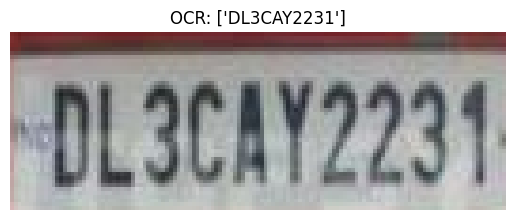

Detected Plate: ['KA 05', 'HS 4495']


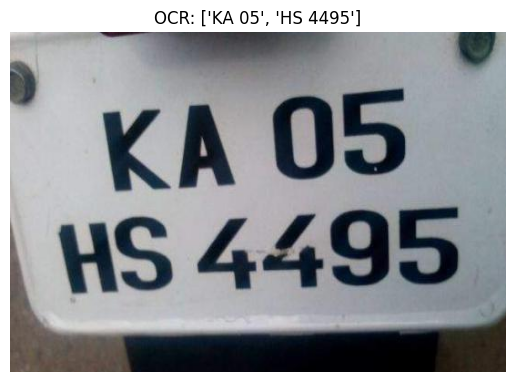

Detected Plate: ['MHO6 AW8929']


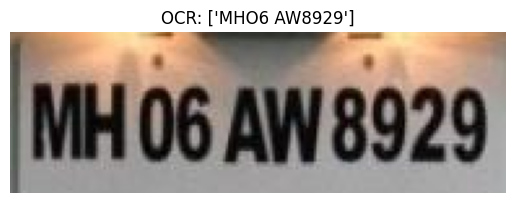

Detected Plate: ['W06Ae929']


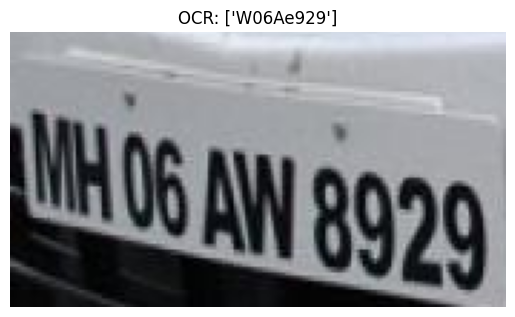

Detected Plate: ['I7TXTA']


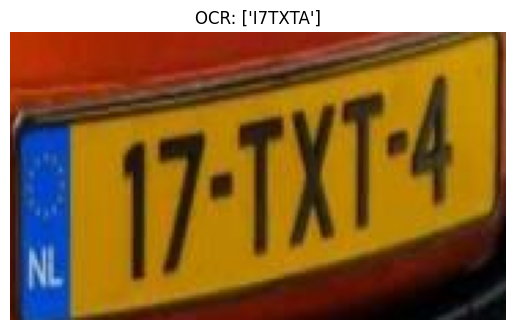

Detected Plate: ['XA 08 Ab  3380']


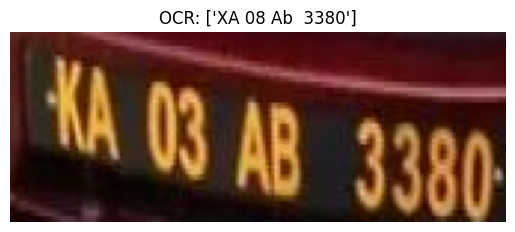

Detected Plate: ['HR 69 6969']


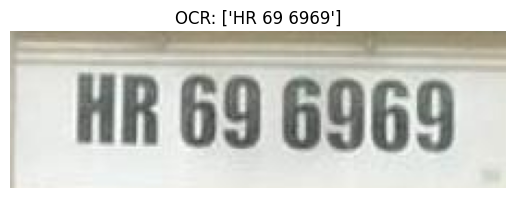

Detected Plate: ['HRIUIU']


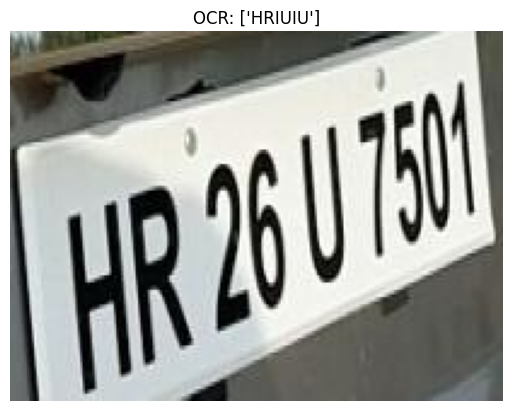

Detected Plate: ['HH: 20 FI 0 45']


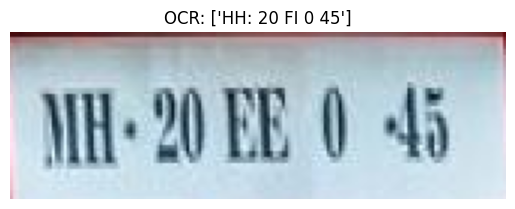

Detected Plate: ['MH 14 ICE 460']


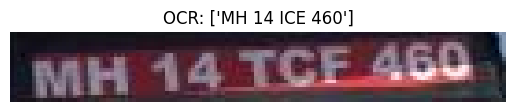

In [13]:
import cv2
import easyocr
from ultralytics import YOLO


model = YOLO("/content/runs/license_plate9/weights/best.pt")


reader = easyocr.Reader(['en'])


img_path = "/content/data/test/images/"
results = model(img_path)


for r in results:
    for box in r.boxes:
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        img = cv2.imread(r.path)
        crop = img[y1:y2, x1:x2]  # crop plate region


        text = reader.readtext(crop, detail=0)
        print(f"Detected Plate: {text}")


        from matplotlib import pyplot as plt
        plt.imshow(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))
        plt.title(f"OCR: {text}")
        plt.axis("off")
        plt.show()

/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:518: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


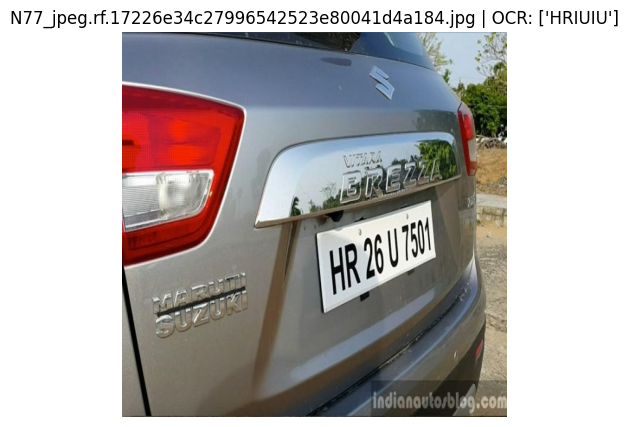


image 1/1 /content/data/test/images/N235_jpeg.rf.4cdc9ca3a045b0dd101736e2a0d5e489.jpg: 640x640 1 number_plate, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


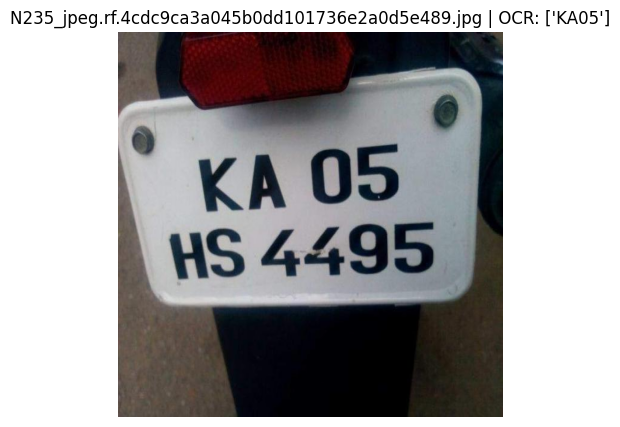


image 1/1 /content/data/test/images/N27_jpeg.rf.38d16f7b2d9728715b43d85792da971a.jpg: 640x640 1 number_plate, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


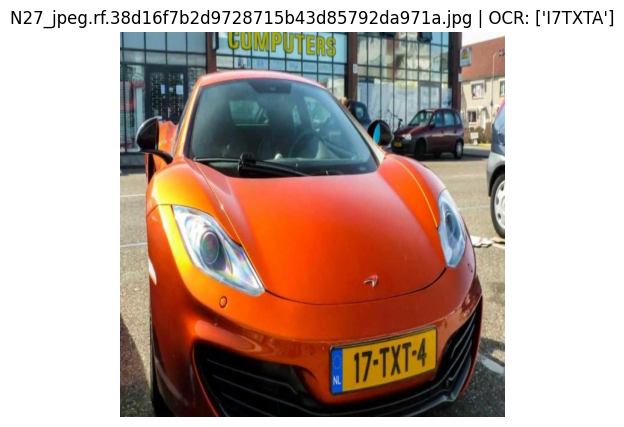


image 1/1 /content/data/test/images/N143_jpeg.rf.0cdbb4ab28cfdeda413185bfc187b70e.jpg: 640x640 1 number_plate, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


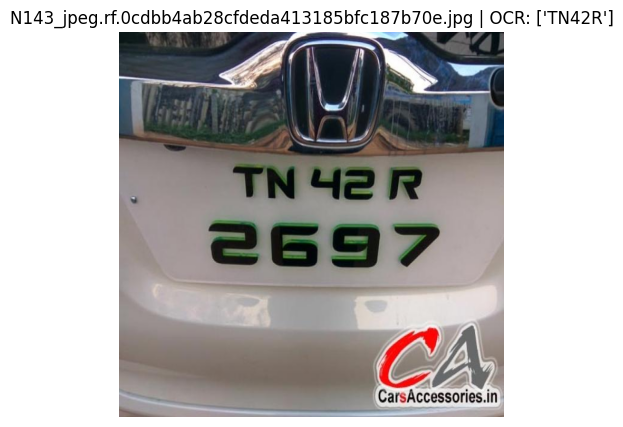


image 1/1 /content/data/test/images/N46_jpeg.rf.a360058eb818cd2896305cc53cca9458.jpg: 640x640 (no detections), 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/data/test/images/N245_jpeg.rf.c7acc92ee2f8a3af5715d406ab832bc3.jpg: 640x640 1 number_plate, 7.3ms
Speed: 2.1ms preprocess, 7.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


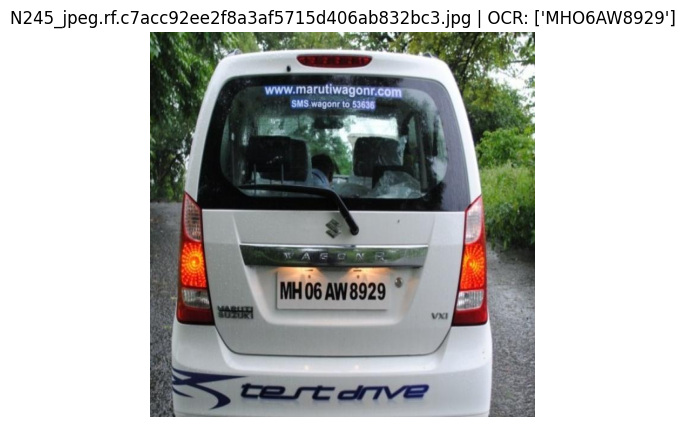


image 1/1 /content/data/test/images/N171_jpeg.rf.66b3325cd6b4f3be09598f7cecbdacbe.jpg: 640x640 1 number_plate, 12.2ms
Speed: 2.4ms preprocess, 12.2ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)


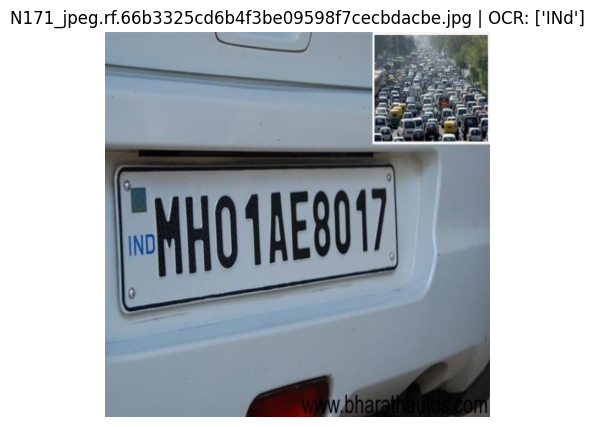


image 1/1 /content/data/test/images/N230_jpeg.rf.47fd85f809ad4c06055186b92a18caa8.jpg: 640x640 1 number_plate, 10.0ms
Speed: 2.5ms preprocess, 10.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


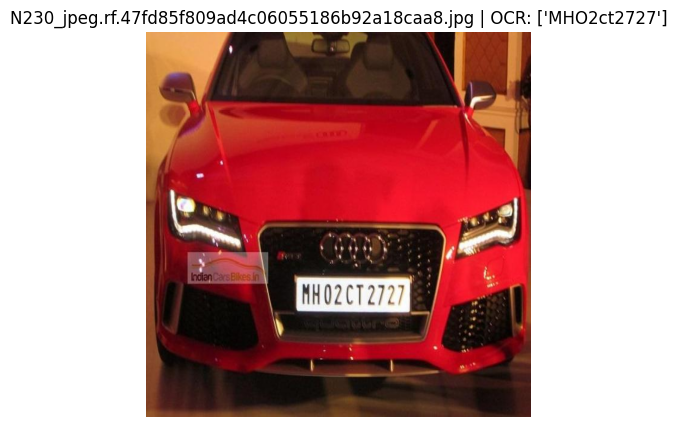


image 1/1 /content/data/test/images/N232_jpeg.rf.bc5282b83813db7793f39df3e05e1dcc.jpg: 640x640 1 number_plate, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


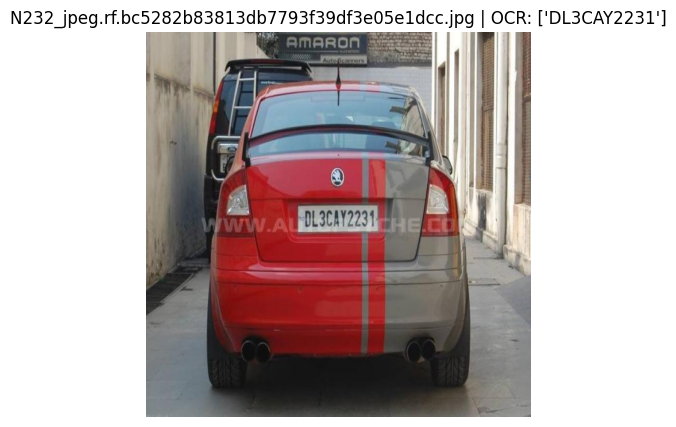


image 1/1 /content/data/test/images/N164_jpeg.rf.793189d0b6752af58e6d939746dc54db.jpg: 640x640 1 number_plate, 10.0ms
Speed: 2.3ms preprocess, 10.0ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


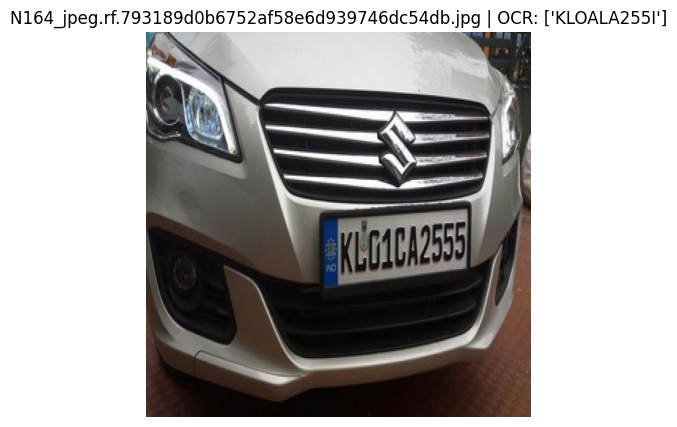


image 1/1 /content/data/test/images/N215_jpeg.rf.22266e54c601e36101476030c9d9851b.jpg: 640x640 1 number_plate, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


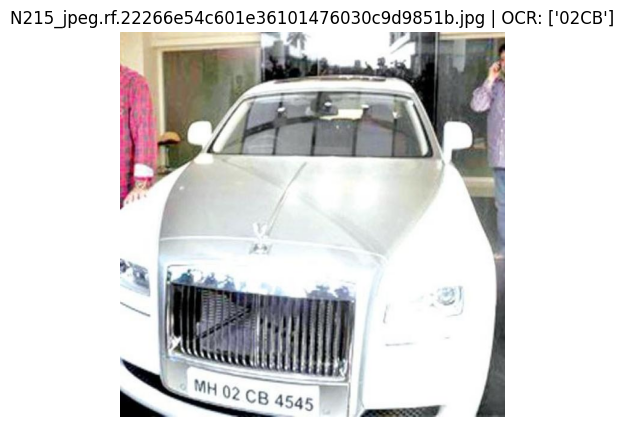


image 1/1 /content/data/test/images/N52_jpeg.rf.ae48809f9fe4cf4c7e14fd1cd3f05180.jpg: 640x640 1 number_plate, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


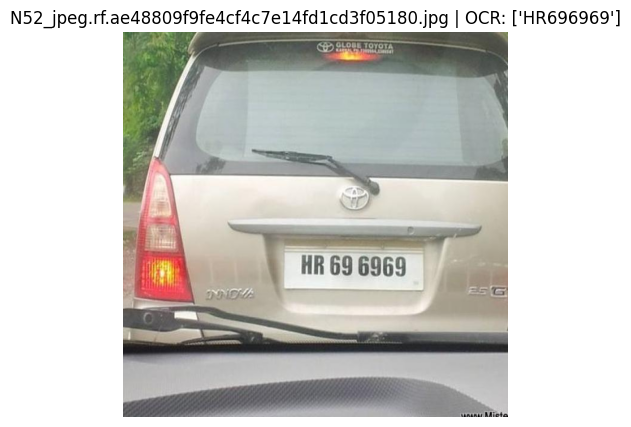


image 1/1 /content/data/test/images/N111_jpeg.rf.04c56819f9fa4b24ca255a859d21659a.jpg: 640x640 1 number_plate, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


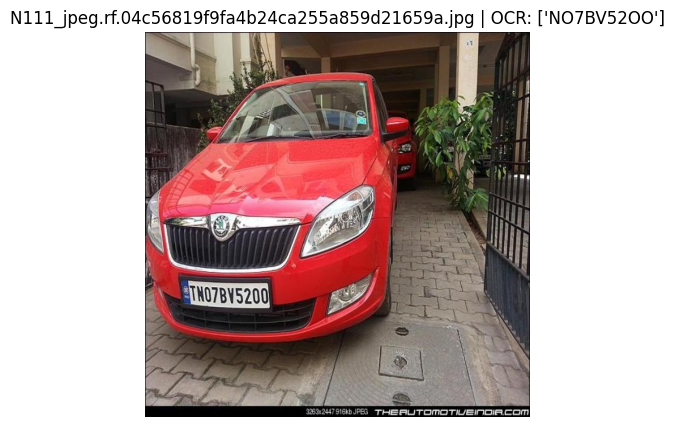


image 1/1 /content/data/test/images/N43_jpeg.rf.98545f3adac05f6cda7c693481a5bf64.jpg: 640x640 1 number_plate, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


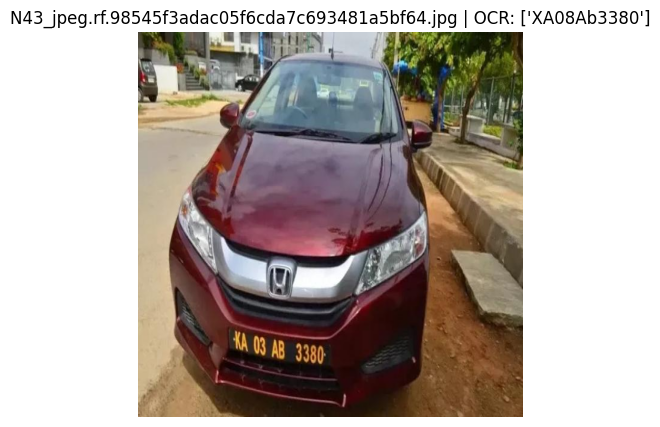


image 1/1 /content/data/test/images/N138_jpeg.rf.2c572eeb235cf393a71a91223684c3a0.jpg: 640x640 1 number_plate, 12.7ms
Speed: 2.8ms preprocess, 12.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)


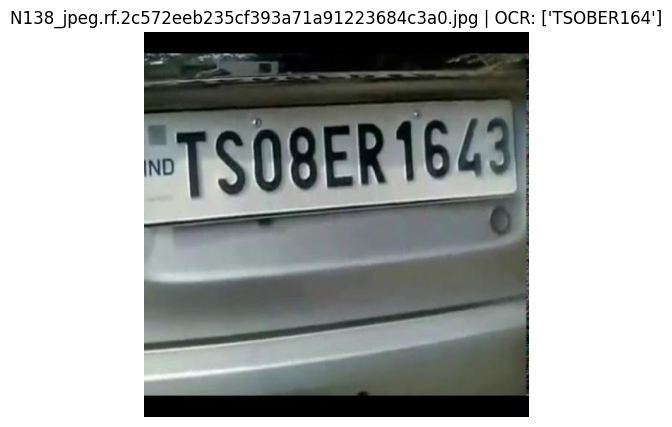


image 1/1 /content/data/test/images/N246_jpeg.rf.3fe4aabb8b394cd29d2a0787b882e7ac.jpg: 640x640 1 number_plate, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


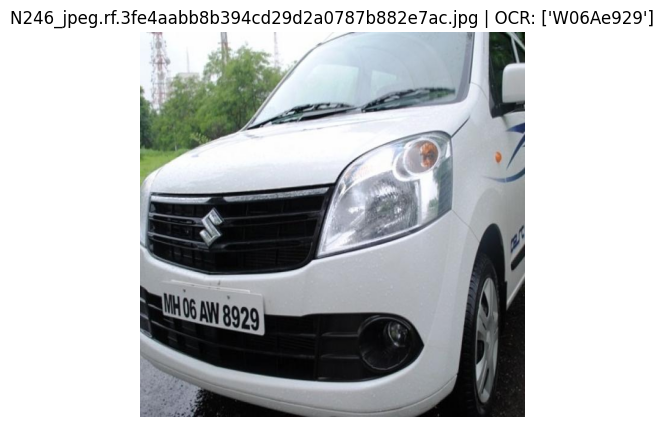


image 1/1 /content/data/test/images/N82_jpeg.rf.aac837025d454d4c1ece53cca9249035.jpg: 640x640 1 number_plate, 10.1ms
Speed: 2.3ms preprocess, 10.1ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


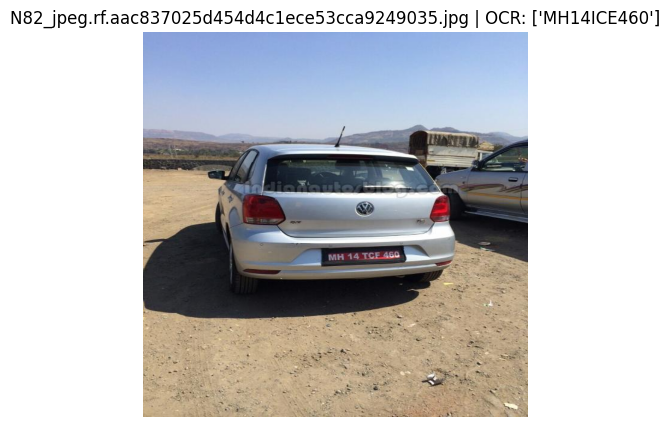


image 1/1 /content/data/test/images/N113_jpeg.rf.62bc8dc73e4182970e620e0ee5ff6d13.jpg: 640x640 1 number_plate, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


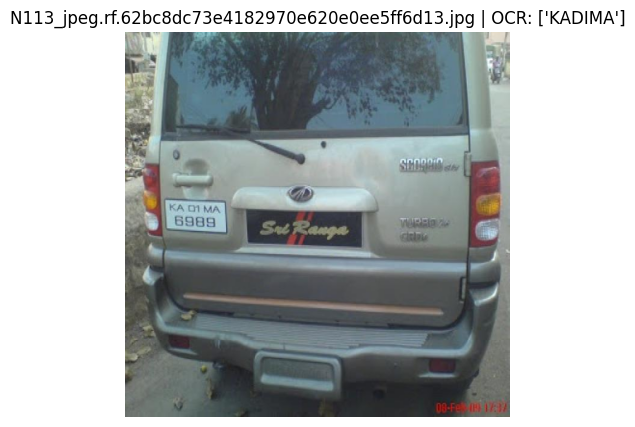


image 1/1 /content/data/test/images/N128_jpeg.rf.85b3a990f1d768f50fa54ac50d9ab935.jpg: 640x640 1 number_plate, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


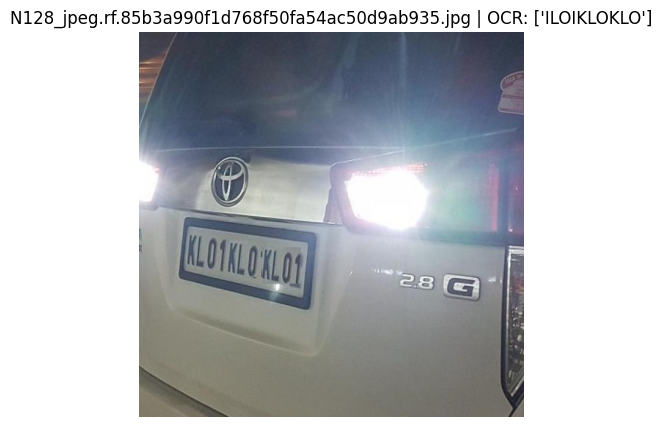


image 1/1 /content/data/test/images/N80_jpeg.rf.39333f0654c9947552557bb801fac915.jpg: 640x640 1 number_plate, 9.6ms
Speed: 2.4ms preprocess, 9.6ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


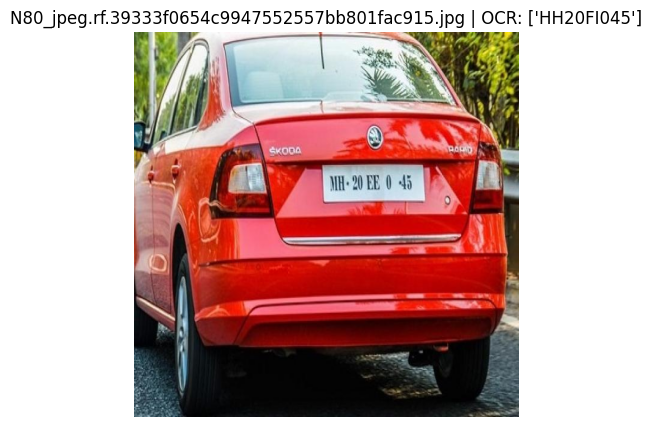


image 1/1 /content/data/test/images/N222_jpeg.rf.fdf2f55e2bc308012e273d36b73b194f.jpg: 640x640 1 number_plate, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


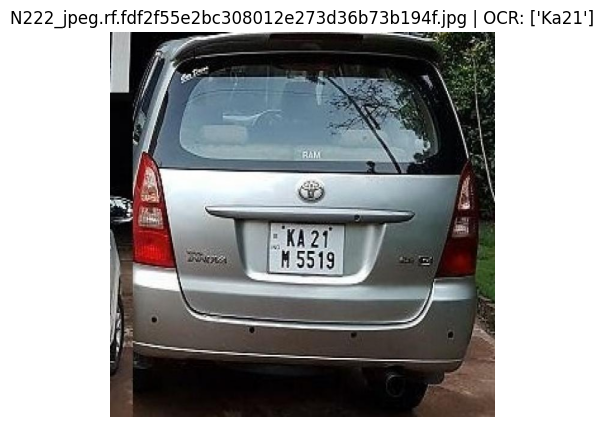


image 1/1 /content/data/test/images/N132_jpeg.rf.fa68e421d729c0b2609fe5fdaff3d061.jpg: 640x640 (no detections), 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/data/test/images/N136_jpeg.rf.0a082b44b1bfe3d2287c7dee25a375f4.jpg: 640x640 3 number_plates, 8.7ms
Speed: 1.9ms preprocess, 8.7ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


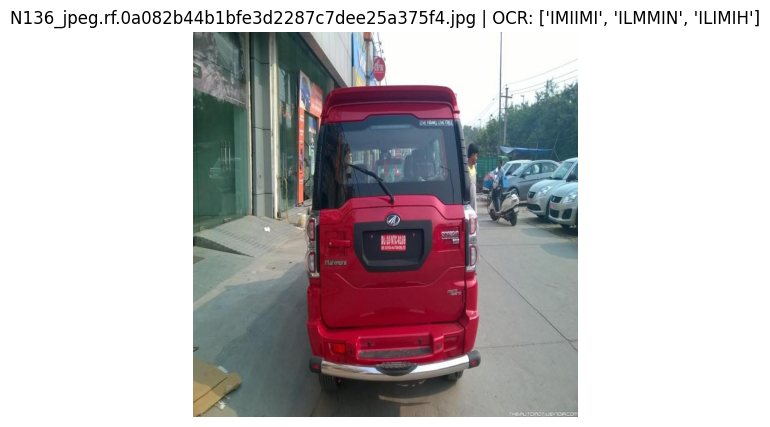

N77_jpeg.rf.17226e34c27996542523e80041d4a184.jpg --> ['HRIUIU']
N235_jpeg.rf.4cdc9ca3a045b0dd101736e2a0d5e489.jpg --> ['KA05']
N27_jpeg.rf.38d16f7b2d9728715b43d85792da971a.jpg --> ['I7TXTA']
N143_jpeg.rf.0cdbb4ab28cfdeda413185bfc187b70e.jpg --> ['TN42R']
N46_jpeg.rf.a360058eb818cd2896305cc53cca9458.jpg --> []
N245_jpeg.rf.c7acc92ee2f8a3af5715d406ab832bc3.jpg --> ['MHO6AW8929']
N171_jpeg.rf.66b3325cd6b4f3be09598f7cecbdacbe.jpg --> ['INd']
N230_jpeg.rf.47fd85f809ad4c06055186b92a18caa8.jpg --> ['MHO2ct2727']
N232_jpeg.rf.bc5282b83813db7793f39df3e05e1dcc.jpg --> ['DL3CAY2231']
N164_jpeg.rf.793189d0b6752af58e6d939746dc54db.jpg --> ['KLOALA255I']
N215_jpeg.rf.22266e54c601e36101476030c9d9851b.jpg --> ['02CB']
N52_jpeg.rf.ae48809f9fe4cf4c7e14fd1cd3f05180.jpg --> ['HR696969']
N111_jpeg.rf.04c56819f9fa4b24ca255a859d21659a.jpg --> ['NO7BV52OO']
N43_jpeg.rf.98545f3adac05f6cda7c693481a5bf64.jpg --> ['XA08Ab3380']
N138_jpeg.rf.2c572eeb235cf393a71a91223684c3a0.jpg --> ['TSOBER164']
N246_jpeg.rf.3fe4a

In [17]:
import cv2
import easyocr
import glob
from ultralytics import YOLO
import matplotlib.pyplot as plt


model = YOLO("/content/runs/license_plate9/weights/best.pt")


reader = easyocr.Reader(['en'])


test_images = glob.glob("/content/data/test/images/*.jpg")

results_dict = {}

for img_path in test_images:
    img = cv2.imread(img_path)
    detections = model(img_path)

    plates = []
    for r in detections:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            crop = img[y1:y2, x1:x2]

            # OCR on crop
            text = reader.readtext(crop, detail=0)
            if text:
                cleaned_text = "".join([c for c in text[0] if c.isalnum()])  # filter non-alphanumeric
                plates.append(cleaned_text)

    results_dict[img_path] = plates


    if plates:
        plt.figure(figsize=(8,5))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{img_path.split('/')[-1]} | OCR: {plates}")
        plt.axis("off")
        plt.show()


for k,v in results_dict.items():
    print(f"{k.split('/')[-1]} --> {v}")


In [18]:
import pandas as pd


rows = []
for img_path, plates in results_dict.items():
    if plates:
        for plate in plates:
            rows.append({"image": img_path.split("/")[-1], "plate_text": plate})
    else:
        rows.append({"image": img_path.split("/")[-1], "plate_text": "NO_PLATE_DETECTED"})

df = pd.DataFrame(rows)


csv_path = "/content/ocr_results.csv"
df.to_csv(csv_path, index=False)

print(f"OCR results saved to {csv_path}")
df.head()


OCR results saved to /content/ocr_results.csv


,image,plate_text
0,N77_jpeg.rf.17226e34c27996542523e80041d4a184.jpg,HRIUIU
1,N235_jpeg.rf.4cdc9ca3a045b0dd101736e2a0d5e489.jpg,KA05
2,N27_jpeg.rf.38d16f7b2d9728715b43d85792da971a.jpg,I7TXTA
3,N143_jpeg.rf.0cdbb4ab28cfdeda413185bfc187b70e.jpg,TN42R
4,N46_jpeg.rf.a360058eb818cd2896305cc53cca9458.jpg,NO_PLATE_DETECTED


In [19]:
from google.colab import files
files.download("/content/ocr_results.csv")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [20]:
import cv2
import glob


image_paths = sorted(glob.glob("/content/data/test/images/*.jpg"))


frame = cv2.imread(image_paths[0])
height, width, _ = frame.shape
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter("demo_input.mp4", fourcc, 3, (width, height))  # 3 FPS

for img_path in image_paths:
    frame = cv2.imread(img_path)
    out.write(frame)

out.release()
print(" Demo video created: demo_input.mp4")


 Demo video created: demo_input.mp4


In [22]:
import easyocr
from ultralytics import YOLO


model = YOLO("/content/runs/license_plate9/weights/best.pt")
reader = easyocr.Reader(['en'])

cap = cv2.VideoCapture("demo_input.mp4")
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter("demo_output.mp4", fourcc, 3, (width, height))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)
    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            crop = frame[y1:y2, x1:x2]

            text = reader.readtext(crop, detail=0)
            if text:
                plate_text = "".join([c for c in text[0] if c.isalnum()])
            else:
                plate_text = ""

            cv2.rectangle(frame, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(frame, plate_text, (x1, y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

    out.write(frame)

cap.release()
out.release()
print(" Processed demo video saved as demo_output.mp4")



0: 640x640 1 number_plate, 15.4ms
Speed: 2.3ms preprocess, 15.4ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 7.6ms
Speed: 2.2ms preprocess, 7.6ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 7.4ms
Speed: 2.1ms preprocess, 7.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 (no detections), 7.6ms
Speed: 2.0ms preprocess, 7.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 7.4ms
Speed: 2.0ms preprocess, 7.4ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 7.5ms
Speed: 2.1ms preprocess, 7.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 number_plate, 11.8ms
Speed: 2.1ms preprocess, 11.8ms inference, 2.5ms pos

 Processed demo video saved as demo_output.mp4


In [23]:
from google.colab import files
files.download("demo_output.mp4")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [32]:
import matplotlib.pyplot as plt
from ultralytics import YOLO
from google.colab import files

# Load your trained model once
model = YOLO("/content/runs/license_plate9/weights/best.pt")

# Initialize OCR once
reader = easyocr.Reader(['en'])

def detect_and_ocr():
    # Upload new image
    uploaded = files.upload()
    img_path = list(uploaded.keys())[0]

    # Run YOLO detection
    results = model(img_path)
    img = cv2.imread(img_path)

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            crop = img[y1:y2, x1:x2]

            # OCR on crop
            text = reader.readtext(crop, detail=0)
            plate_text = "".join([c for c in text[0] if c.isalnum()]) if text else "UNKNOWN"

            # Draw bounding box + OCR result
            cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(img, plate_text, (x1, y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

    # Show image
    plt.figure(figsize=(10,6))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()

/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py:518: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(file, map_location='cpu'), file  # load


In [ ]:
detect_and_ocr()


In [33]:
model = YOLO("/content/runs/license_plate9/weights/best.pt")
reader = easyocr.Reader(['en'])

def batch_detect_and_ocr():

    uploaded = files.upload()
    results_dict = {}

    for img_path in uploaded.keys():
        img = cv2.imread(img_path)
        detections = model(img_path)
        plates = []

        for r in detections:
            for box in r.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                crop = img[y1:y2, x1:x2]


                text = reader.readtext(crop, detail=0)
                if text:
                    plate_text = "".join([c for c in text[0] if c.isalnum()])
                    plates.append(plate_text)

                    cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
                    cv2.putText(img, plate_text, (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

        results_dict[img_path] = plates if plates else ["NO_PLATE_DETECTED"]


        plt.figure(figsize=(10,6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{img_path} | OCR: {results_dict[img_path]}")
        plt.axis("off")
        plt.show()

    return results_dict



In [ ]:
results = batch_detect_and_ocr()
for img, plates in results.items():
    print(f"{img} --> {plates}")


In [36]:
model = YOLO("/content/runs/license_plate9/weights/best.pt")
reader = easyocr.Reader(['en'])

def batch_detect_and_ocr_to_csv(csv_path="/content/batch_ocr_results.csv"):

    uploaded = files.upload()
    results_dict = {}
    rows = []

    for img_path in uploaded.keys():
        img = cv2.imread(img_path)
        detections = model(img_path)
        plates = []

        for r in detections:
            for box in r.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0])
                crop = img[y1:y2, x1:x2]


                text = reader.readtext(crop, detail=0)
                if text:
                    plate_text = "".join([c for c in text[0] if c.isalnum()])
                    plates.append(plate_text)


                    cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
                    cv2.putText(img, plate_text, (x1, y1-10),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

        results_dict[img_path] = plates if plates else ["NO_PLATE_DETECTED"]


        for plate in results_dict[img_path]:
            rows.append({"image": img_path, "plate_text": plate})


        plt.figure(figsize=(10,6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"{img_path} | OCR: {results_dict[img_path]}")
        plt.axis("off")
        plt.show()


    df = pd.DataFrame(rows)
    df.to_csv(csv_path, index=False)

    print(f"Batch OCR results saved to {csv_path}")
    return results_dict, csv_path


In [ ]:
results, csv_file = batch_detect_and_ocr_to_csv()
for img, plates in results.items():
    print(f"{img} --> {plates}")

from google.colab import files
files.download(csv_file)


In [4]:

!git config --global user.email "sohamgupta779@gmil.com"
!git config --global user.name "sohamgupta779-art"


!git clone https://github.com/sohamgupta779-art/license-plate--detection.git
%cd license-plate--detection



Cloning into 'license-plate--detection'...
/content/license-plate--detection/license-plate--detection/license-plate--detection


In [5]:
%%bash
# Create README.md
cat > README.md <<'EOF'
# Automatic License Plate Detection & Recognition

This project implements **automatic license plate detection** using YOLOv8 and **OCR recognition** using EasyOCR.
It is trained on a custom dataset (~500+ images) prepared with Roboflow.

## Features
- YOLOv8 for license plate detection
- EasyOCR for text recognition
- Training in Google Colab with GPU
- Batch inference with CSV export
- Demo video pipeline

## Quick Start
```bash
pip install -r requirements.txt
python src/detect_and_ocr.py --image path/to/image.jpg


Dataset & Model
Dataset: prepared & augmented in Roboflow
Model Weights: Download best.pt
Results

Example detection + OCR:

License

MIT License
EOF

In [7]:
%%bash
# Make folders
mkdir -p src notebooks demo

# README.md (short version for now)
cat > README.md <<'EOF'
# Automatic License Plate Detection & Recognition 🚗🔍

End-to-end pipeline for **license plate detection** using YOLOv8 and **OCR recognition** with EasyOCR.
Trained on a custom Roboflow dataset (~500+ images) in Google Colab.
Supports inference on images, batch processing with CSV export, and video demo pipeline.
EOF

# .gitignore
cat > .gitignore <<'EOF'
__pycache__/
*.pyc
*.pyo
*.pyd
*.pt
*.pth
*.ckpt
*.zip
.ipynb_checkpoints/
env/
venv/
data/
.DS_Store
Thumbs.db
EOF

# requirements.txt
cat > requirements.txt <<'EOF'
ultralytics==8.0.120
torch==2.5.1
torchvision==0.20.1
opencv-python
easyocr
numpy
pandas
matplotlib
tqdm
EOF

# Simple script: src/detect_and_ocr.py
cat > src/detect_and_ocr.py <<'EOF'
import cv2
import easyocr
from ultralytics import YOLO

def run_inference(weights, image_path):
    model = YOLO(weights)
    reader = easyocr.Reader(['en'])
    img = cv2.imread(image_path)
    results = model(image_path)

    for r in results:
        for box in r.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])
            crop = img[y1:y2, x1:x2]
            text = reader.readtext(crop, detail=0)
            plate = text[0] if text else "UNKNOWN"
            cv2.rectangle(img, (x1,y1), (x2,y2), (0,255,0), 2)
            cv2.putText(img, plate, (x1, y1-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0,255,0), 2)

    out_path = "demo/output.jpg"
    cv2.imwrite(out_path, img)
    print(f"✅ Saved result to {out_path}")

if __name__ == "__main__":
    run_inference("best.pt", "demo/sample_input.jpg")
EOF
